<a href="https://colab.research.google.com/github/Tahimi/pollutantTransportInPerucabaLakeAL/blob/main/pollutantTransportInPerucabaLakeAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install necessary packages





In [6]:
!apt-get install gmsh
!pip install Gmsh
!pip install -U kaleido
!pip install plotly-gif
!pip install fipy
#Obs. restart runtime env. after installing fipy to be able to import it

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  gmsh-doc libalglib3.18 libfltk-gl1.3 libfltk-images1.3 libfltk1.3
  libfreeimage3 libglu1-mesa libgmsh4.8 libjxr0 libmetis5
  libocct-data-exchange-7.5 libocct-foundation-7.5
  libocct-modeling-algorithms-7.5 libocct-modeling-data-7.5 libocct-ocaf-7.5
  libocct-visualization-7.5 libraw20 libvoro++1
The following NEW packages will be installed:
  gmsh gmsh-doc libalglib3.18 libfltk-gl1.3 libfltk-images1.3 libfltk1.3
  libfreeimage3 libglu1-mesa libgmsh4.8 libjxr0 libmetis5
  libocct-data-exchange-7.5 libocct-foundation-7.5
  libocct-modeling-algorithms-7.5 libocct-modeling-data-7.5 libocct-ocaf-7.5
  libocct-visualization-7.5 libraw20 libvoro++1
0 upgraded, 19 newly installed, 0 to remove and 16 not upgraded.
Need to get 30.8 MB of archives.
After this operation, 95.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.

# Mount your Google drive folder for input/output

In [1]:
from google.colab import drive

drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [2]:
%cd /content/drive/MyDrive/perucabaLake
%ls

/content/drive/MyDrive/perucabaLake
lakeBoundaryVertices.csv          output/
lakePollutantSourcesVertices.csv  poluttantTransportInPerucabaLake.ipynb


# Discretize the problem's domain

# Clean the domain's Boundary vertices

In [11]:
def filterLakeBoundary(df, dist_min):
  print('Raw data:')
  print('df.shape = ', df.shape)
  x, y = df['x'], df['y']

  listOfFilteredVertices = []
  i = 0
  i_max = len(x)
  # select the first vertice
  listOfFilteredVertices.append(i)
  while i < i_max:
      a = np.array([x[i], y[i]])
      j = 1
      # advance the increment j untill enconter the next distante enough vertice
      while i+j < len(x) and np.linalg.norm(a - np.array([x[i+j], y[i+j]])) <= dist_min:
          j += 1
      if i+j >= i_max:
          break
      # the encountred vertice has index = i + the increment j
      i += j
      # adding this vertice to the selection
      listOfFilteredVertices.append(i)
  # check the distant between the last and first vertices
  if np.linalg.norm(a - np.array([x[0], y[0]])) <= dist_min:
      listOfFilteredVertices.pop(-1)

  print('Filtered data:')
  dfFiltered = df.iloc[listOfFilteredVertices].copy()
  xmin, ymin = min(dfFiltered['x']), min(dfFiltered['y'])
  dfFiltered['x'] = dfFiltered['x'] - xmin
  dfFiltered['y'] = dfFiltered['y'] - ymin

  print('dfFiltered.shape = ', dfFiltered.shape)
  print(dfFiltered.head(3))

  return dfFiltered

In [12]:
import pandas as pd
import numpy as np

lakeBoundaryVerticesCSV = './lakeBoundaryVertices.csv'
dist_min = 30. # (m)

dfLakeBoundary = pd.read_csv(lakeBoundaryVerticesCSV, usecols = ['x', 'y'])
dfFilteredLakeBoundary = filterLakeBoundary(dfLakeBoundary, dist_min)

outputFile = './output/lakeBoundaryVerticesFiltered.csv'
dfFilteredLakeBoundary.to_csv(outputFile)

Raw data:
df.shape =  (285, 2)
Filtered data:
dfFiltered.shape =  (184, 2)
     x   y
0  908   0
2  939  32
4  970  63


# Write geo file for irregular mesh

In [13]:
def writeIrregularGeoFile(dfFiltered, fileName, dist_min):
    x, y, verticesNbr = dfFiltered['x'].tolist(), dfFiltered['y'].tolist(), dfFiltered.shape[0]

    with open(fileName, 'w') as geoFile:
        geoFile.write('lc = '+str(dist_min)+'; // characteristic length of mesh elements\n')
        geoFile.write('\n// defining the points\n')
        pointIdx = 0
        for i in range(verticesNbr):
            txtLine = 'Point('+str(i+1)+') = {'+str(x[i])+','+str(y[i])+','+str(0.)+',lc};\n'
            geoFile.write(txtLine)

        geoFile.write('\n// defining the lines\n')
        linesNbr = verticesNbr
        for i in range(linesNbr):
            txtLine = 'Line('+str(i+1)+') = {'+str(i+1)+','+str(i+2)+'};\n'
            if i == linesNbr-1:
                txtLine = 'Line('+str(i+1)+') = {'+str(i+1)+','+str(1)+'};\n'
            geoFile.write(txtLine)

        geoFile.write('\n// defining the line loop and the plane surface\n')
        geoFile.write('Line Loop(1) = {')
        [geoFile.write(str(i)+',') for i in range(1,linesNbr)]
        geoFile.write(str(linesNbr)+'};\n')
        geoFile.write('Plane Surface(1) = {1};\n')

        geoFileFinalParte='''
// Define the meshing algorithm for the surface
Mesh.Algorithm = 8; // Frontal-Delaunay for quads

// Define the number of cells for the mesh
Mesh.RecombinationAlgorithm = 2; // full-quad recombination algorithm
Mesh.RecombineAll = 1;'''
        geoFile.write(geoFileFinalParte)
        print('successfully generated file:', fileName)

In [14]:
outputFileName = './output/irregularGrid/lakeIrregularGeoFile.geo.txt'
writeIrregularGeoFile(dfFilteredLakeBoundary, outputFileName, dist_min = 100.)

successfully generated file: ./output/lakeIrregularGeoFile.geo.txt


# Write geo file for regular mesh

In [38]:
from shapely.geometry import Point

def isInLakeCell(polygonLake, xyList):
  isInLakeVertexList = []
  for xy in xyList:
    isInLakeVertex = polygonLake.contains(Point(xy))
    isInLakeVertexList.append(isInLakeVertex)
  return isInLakeVertexList.count(True) > 1

In [39]:
def addGeoPoint(xy, geoFile, geoPointIdx):
  geoFile.write('Point(' + str(geoPointIdx) + ') = {' + str(xy[0]) + ',' + str(xy[1]) + ', 0., cl};\n')
  return geoPointIdx + 1

def addGeoLine(pI, pF, geoFile, geoLineIdx):
  geoFile.write('Line(' + str(geoLineIdx) + ') = {' + str(pI) + ',' + str(pF) + '};\n')
  return geoLineIdx + 1

def addGeoPolygon(xyList,
                  geoFile,
                  geoPointIdx,
                  geoLineIdx,
                  geoCurveLineIdx):
  xy = xyList[0]
  geoPointIdx = addGeoPoint(xy, geoFile, geoPointIdx)
  for xy in xyList[1:]:
    geoPointIdx = addGeoPoint(xy, geoFile, geoPointIdx)
    geoLineIdx = addGeoLine(geoPointIdx-2, geoPointIdx-1, geoFile, geoLineIdx)
    geoFile.write('\n')
  geoLineIdx = addGeoLine(geoPointIdx-1, geoPointIdx-len(xyList), geoFile, geoLineIdx)

  idxsListSTR = ''
  for idx in range(geoLineIdx-len(xyList), geoLineIdx-1):
    idxsListSTR += str(idx) + ','
  idxsListSTR += str(geoLineIdx-1)
  geoFile.write('Curve Loop(' + str(geoCurveLineIdx) + ') = {' + str(idxsListSTR) + '};\n\n')
  return geoPointIdx, geoLineIdx, geoCurveLineIdx + 1

def addGeoTransfiniteSurface(xyList,
                             geoFile,
                             geoPointIdx,
                             geoLineIdx,
                             geoCurveLineIdx):
  geoFile.write('\n')
  for xy in xyList:
    geoPointIdx = addGeoPoint(xy, geoFile, geoPointIdx)

  geoLineIdx = addGeoLine(geoPointIdx-4, geoPointIdx-3, geoFile, geoLineIdx)
  geoLineIdx = addGeoLine(geoPointIdx-3, geoPointIdx-2, geoFile, geoLineIdx)
  geoLineIdx = addGeoLine(geoPointIdx-2, geoPointIdx-1, geoFile, geoLineIdx)
  geoLineIdx = addGeoLine(geoPointIdx-1, geoPointIdx-4, geoFile, geoLineIdx)

  geoLinesListSTR = str(geoLineIdx-4) + ',' + str(geoLineIdx-3) + ',' + str(geoLineIdx-2) + ',' + str(geoLineIdx-1)
  geoFile.write('Curve Loop(' + str(geoCurveLineIdx) + ') = {' + geoLinesListSTR + '};\n')
  geoFile.write('Plane Surface(' + str(geoCurveLineIdx) + ') = {' + str(geoCurveLineIdx) + '};\n')
  geoFile.write('Transfinite Line{' + str(geoLinesListSTR) + '} = 1 Using Progression 1;\n')
  geoFile.write('Transfinite Surface(' + str(geoCurveLineIdx) + ') = {' + str(geoLinesListSTR) + '};\n')
  geoFile.write('Mesh.Color.Quadrangles = {220, 220, 220};\n')
  geoFile.write('Mesh.Color.Lines = {0, 0, 0};\n')
  return geoPointIdx, geoLineIdx, geoCurveLineIdx + 1

In [40]:
import pandas as pd
from shapely.geometry import Polygon
import matplotlib.pyplot as plt

def polygonVertices(xList, yList):
  df = pd.DataFrame()
  df['x'] = xList
  df['y'] = yList
  return list(map(tuple, np.asarray(df)))

def writeRegularGeoFile(dfFiltered, fileName, dist_min):
  dx = dy = dist_min

  xmin, xmax = min(dfFiltered['x']), max(dfFiltered['x'])
  delX = xmax - xmin
  nx = columnsNbr = int(delX/dx)
  ymin, ymax = min(dfFiltered['y']), max(dfFiltered['y'])
  delY = ymax - ymin
  ny = linesNbr = int(delY/dy)

  xBB = [xmin, xmax, xmax, xmin, xmin]
  yBB = [ymin, ymin, ymax, ymax, ymin]
  plt.plot(xBB, yBB)
  xyBB = polygonVertices(xBB, yBB)
  polygonBB = Polygon(xyBB)

  xLake = dfFiltered['x'].tolist()
  yLake = dfFiltered['y'].tolist()
  plt.plot(xLake, yLake)
  xyLake = polygonVertices(xLake, yLake)
  polygonLake = Polygon(xyLake)

  with open(fileName, 'w') as geoFile:
    geoFile.write('cl = 0.1;\n')
    geoPointIdx = 1; geoLineIdx = 1; geoCurveLineIdx = 1;
    for lineIdx in range(0, linesNbr):
      for columnIdx in range(0, columnsNbr):
        xyLB = (columnIdx*dx, lineIdx*dy)
        xyLR = ((columnIdx+1)*dx, lineIdx*dy)
        xyRT = ((columnIdx+1)*dx, (lineIdx+1)*dy)
        xyLT = (columnIdx*dx, (lineIdx+1)*dy)
        xyList = [xyLB, xyLR, xyRT, xyLT]

        if isInLakeCell(polygonLake, xyList):
          geoPointIdx, geoLineIdx, geoCurveLineIdx = addGeoTransfiniteSurface(xyList,
                                                                              geoFile,
                                                                              geoPointIdx,
                                                                              geoLineIdx,
                                                                              geoCurveLineIdx)

    geoFile.write('\n')
    geoPointIdx, geoLineIdx, geoCurveLineIdx = addGeoPolygon(xyBB,
                                                             geoFile,
                                                             geoPointIdx,
                                                             geoLineIdx,
                                                             geoCurveLineIdx)
    geoPointIdx, geoLineIdx, geoCurveLineIdx = addGeoPolygon(xyLake,
                                                             geoFile,
                                                             geoPointIdx,
                                                             geoLineIdx,
                                                             geoCurveLineIdx)
    geoFile.write('Recombine Surface {:};\n')
    geoFile.write('Coherence;\n')
    print('successfully generated file:', fileName)

successfully generated file: ./output/regular15Grid/regular15GridGeoFile.geo.txt


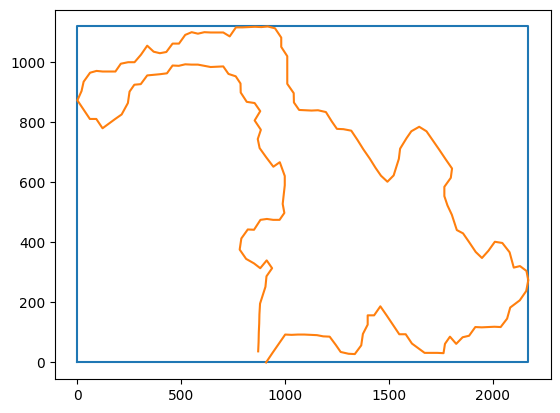

In [42]:
gridType = 'regular15'
outputFileName = r'./output/' + gridType + 'Grid/' + gridType + 'GridGeoFile.geo.txt'
writeRegularGeoFile(dfFilteredLakeBoundary, outputFileName, dist_min = 15.)

# Space discretization (Instanciate the mesh)

In [43]:
%cd /content/drive/MyDrive/perucabaLake
%ls

/content/drive/MyDrive/perucabaLake
lakeBoundaryVertices.csv          output/
lakePollutantSourcesVertices.csv  poluttantTransportInPerucabaLake.ipynb


In [44]:
# space discretization
import numpy as np
from fipy import *

gridType = 'regular15'
geoFileName = r'./output/' + gridType + 'Grid/' + gridType + 'GridGeoFile.geo.txt'
print('input geometry file for Gmsh: ', geoFileName)

cl = 15.
mesh = Gmsh2D(geoFileName)
xL, xR = min(mesh.x), max(mesh.x)
yL, yR = min(mesh.y), max(mesh.y)
delX, delY = np.rint(xR-xL), np.rint(yR-yL)
nx, ny = int(delX/cl), int(delY/cl)

print('caracteristic length, cl (m) = ', cl, '\n'
      'delX (m) = ', delX, ', delY (m) = ', delY, '\n'
      'nx = ', nx, ', ny = ', ny, '\n'
      'number of mesh cells = ', mesh.globalNumberOfCells)

input geometry file for Gmsh:  ./output/regular15Grid/regular15GridGeoFile.geo.txt
caracteristic length, cl (m) =  15.0 
delX (m) =  2145.0 , delY (m) =  1095.0 
nx =  143 , ny =  73 
number of mesh cells =  3891


# Time discretization

In [45]:
from datetime import timedelta

def timeSTR(hours):
    seconds = int(hours*3600)
    return str(timedelta(seconds=seconds))

def daysSTR(hours):
    seconds = int(hours*3600)
    return str(timedelta(seconds=seconds).days)

# simulation time
tL = 0.0
delT = 12*30*24 # (h)
tR = tL + delT

# advection-base time step size
vx, vy = 0.0931*1e3, -0.0386*1e3 # (m/h)
Cr = 0.8 # Courant Number: Cr = u*dt/dx
dtAdv = Cr*cl/max(abs(vx),abs(vy))

# diffusion-base time step size
D = (delX*delY)/(10*24) # (m**2/h)
Fr = 0.8 # Fourier Number: Fr = D*dt/dx**2
dtDiff = abs(Fr*cl**2/D)

# define time step size
dt = 1. #dtAdv #min(dtAdv,dtDiff)

nt = int(np.rint(delT/dt))
delT = np.rint(nt*dt)
tR = tL + delT
t = np.linspace(tL, tR, nt+1)

print('advection: vx = ', np.rint(vx), ', vy = ', np.rint(vy), ', Cr = u*dt/dx = ', Cr, ', dtAdv = ', timeSTR(dtAdv), '\n'
      'diffusion: D = ', np.rint(D), ', Fr = D*dt/dx**2 = ', Fr, ', dtDiff = ', timeSTR(dtDiff), '\n'
      'time range: tL = ', t[0], ', tR = ', t[-1], ', delT = ', timeSTR(delT), '\n'
      'time step size: dt = ', timeSTR(dt), ', nt = ', nt)

advection: vx =  93.0 , vy =  -39.0 , Cr = u*dt/dx =  0.8 , dtAdv =  0:07:44 
diffusion: D =  9787.0 , Fr = D*dt/dx**2 =  0.8 , dtDiff =  0:01:06 
time range: tL =  0.0 , tR =  8640.0 , delT =  360 days, 0:00:00 
time step size: dt =  1:00:00 , nt =  8640


# Sources definition

In [46]:
# the source center in the grid is the grid cell the closest
# to the given source point

def sourceCenter(sourcePos):
    global mesh
    x, y = mesh.x, mesh.y
    xs1, ys1 = sourcePos
    dist2Source = DistanceVariable(mesh=mesh,
                                   value=numerix.sqrt((x-xs1)**2+(y-ys1)**2))
    sourceClosestCellMask = (dist2Source == dist2Source.min())
    xcs, *_ = x[sourceClosestCellMask]
    ycs, *_ = y[sourceClosestCellMask]
    return (xcs, ycs)

In [47]:
# the source grid mask is the selection of all the grid cells in the vinicity
# of the source center, (boolean selection of mesh elements in fipy)

def sourceGridMask(xcs, ycs, isPonctual=True, width=30., isRectangular=False):
    global mesh
    x, y = mesh.x, mesh.y
    ds = DistanceVariable(mesh=mesh,
                          value=numerix.sqrt((x-xcs)**2+(y-ycs)**2))

    # the source is ponctual (the source is composed of only one grid cell)
    if isPonctual:
        sourceClosestCellMask = (ds == ds.min())
        return sourceClosestCellMask

    # the source shape is rectangular
    if isRectangular:
        return ((xcs-width<x) & (x<xcs+width) \
              & (ycs-width<y) & (y<ycs+width))

    # the source shape is circular
    else:
        return (ds <= width)

In [48]:
# read the unfiltered lake boundary to xompute xmin and ymin
import pandas as pd

lakeBoundaryVertices = './lakeBoundaryVertices.csv'
dfLakeBoundary = pd.read_csv(lakeBoundaryVertices, usecols = ['x', 'y'])
display(dfLakeBoundary.head(3))

xmin, ymin = min(dfLakeBoundary['x']), min(dfLakeBoundary['y'])
print('xmin = ', xmin, ', ymin = ', ymin)

,x,y
0,754053,8920061
1,754058,8920067
2,754084,8920093


xmin =  753145 , ymin =  8920061


In [49]:
# read the pollutant sources points and translate
import pandas as pd

pollutantSourcesFileName = './lakePollutantSourcesVertices.csv'
dfsource = pd.read_csv(pollutantSourcesFileName, usecols = ['x', 'y'])

print('original coordinates of sources')
display(dfsource.head(3))

dfsource['x'], dfsource['y'] = dfsource['x']-xmin, dfsource['y']-ymin

print('translated coordinates of sources')
display(dfsource.head(3))

# read source position, width and intensity
s1Pos, s1Width, s1Value = (dfsource['x'][0], dfsource['y'][0]), cl, 1.
s2Pos, s2Width, s2Value = (dfsource['x'][1], dfsource['y'][1]), cl, 1.
s3Pos, s3Width, s3Value = (dfsource['x'][2], dfsource['y'][2]), cl, 1.

original coordinates of sources


,x,y
0,755336,8920397
1,754755,8920155
2,754183,8921142


translated coordinates of sources


,x,y
0,2191,336
1,1610,94
2,1038,1081


# Equation discretization and dependent variable initialization, z

In [50]:
zMin = 0.
sigmma = 0.25*1e-8 # (1/h)
def initialize():
    # preparing the sources terms
    global s1Pos, s1Width, s1Value
    xcs1, ycs1 = sourceCenter(sourcePos=s1Pos)
    s1Mask = sourceGridMask(xcs=xcs1, ycs=ycs1)

    global s2Pos, s2Width, s2Value
    xcs2, ycs2 = sourceCenter(sourcePos=s2Pos)
    s2Mask = sourceGridMask(xcs=xcs2, ycs=ycs2)

    global s3Pos, s3Width, s3Value
    xcs3, ycs3 = sourceCenter(sourcePos=s3Pos)
    s3Mask = sourceGridMask(xcs=xcs3, ycs=ycs3)

    # unkown's initialization
    global mesh, zMin, zInit, z
    zInit = CellVariable(mesh=mesh, value=zMin)
    zInit.setValue(s1Value, where=s1Mask)
    zInit.setValue(s2Value, where=s2Mask)
    zInit.setValue(s3Value, where=s3Mask)
    z = CellVariable(mesh=mesh, value=zInit)

    # Applying noFlow BC
    z.faceGrad.constrain((0.,), where=mesh.exteriorFaces)

    # Defining the discritized equation
    global vx, vy, D, sigmma, eq
    eq = (TransientTerm(coeff=1.0)
       + PowerLawConvectionTerm(coeff=(vx,vy))
       == DiffusionTerm(coeff=D)
       + ImplicitSourceTerm(coeff=-sigmma)
       - ImplicitSourceTerm(s1Mask * 1e+10) + s1Mask * 1e+10 * s1Value
       - ImplicitSourceTerm(s2Mask * 1e+10) + s2Mask * 1e+10 * s2Value
       - ImplicitSourceTerm(s3Mask * 1e+10) + s3Mask * 1e+10 * s3Value)

# initialize the discritized model
initialize()

# Ploting the unkown's initial distribution

Initial distribution
output initial distribuition, zInit :  ./output/regular15Grid/lakePoluant_zInit.jpg


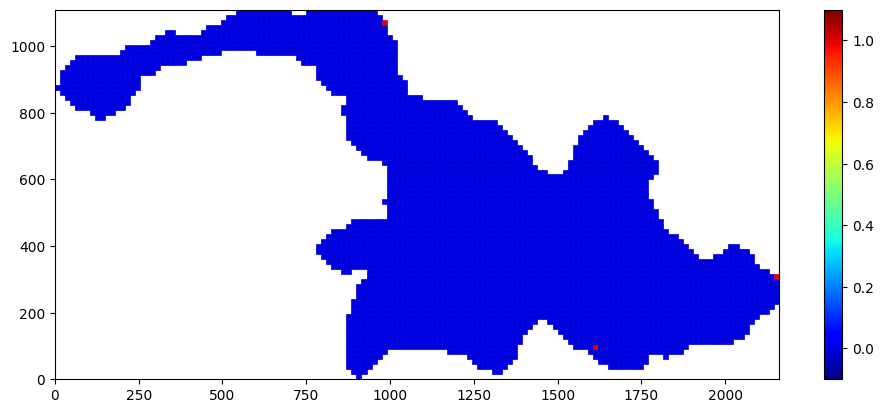

In [51]:
print('Initial distribution')
delZ = zInit.max() - zInit.min()
viewer = Viewer(vars = (zInit),
                datamin = zInit.min()-delZ*.1,
                datamax = zInit.max()+delZ*.1)

outputFileName = r'./output/' + gridType + 'Grid/lakePollutant_zInit.jpg'
print('output initial distribuition, zInit : ', outputFileName)
viewer.plot(outputFileName)

# Run the simulation and save/plot the results

In [52]:
# defining the time-step update function

def advectAndDiffuse1(z, dt):
    eq.solve(var=z, dt=dt)

In [53]:
# definig the time instants for the saving of y

dt4saving = 24*30 # (h)
delIdx = int(np.rint(dt4saving/dt))
save_times = t[range(0, len(t), delIdx)]

closest_idx = lambda val, arr: np.abs(arr - val).argmin()
save_indices = [closest_idx(save_time, t) for save_time in save_times]

print('save_times = ', save_times, '\n'
      'save_indices = ', save_indices)

save_times =  [   0.  720. 1440. 2160. 2880. 3600. 4320. 5040. 5760. 6480. 7200. 7920.
 8640.] 
save_indices =  [0, 720, 1440, 2160, 2880, 3600, 4320, 5040, 5760, 6480, 7200, 7920, 8640]


In [54]:
# Loop over time, calculate z(t,x,y) and save it at save_times
import pandas as pd

# create a pandas data frame  to save data
dfSavedResults = pd.DataFrame(data={'x':mesh.x, 'y':mesh.y})

# define time's and df column's names upon time value
tiSTR = lambda ti: str(round(ti,3))
zColumnName = lambda ti: f'z_{tiSTR(ti)}'

# iterate over time
for i, ti in enumerate(t):
    if i in save_indices:
        dfSavedResults[zColumnName(ti)] = z
    advectAndDiffuse1(z, Fr)

# display dataframe head
dfSavedResults.head(3)

,x,y,z_0.0,z_720.0,z_1440.0,z_2160.0,z_2880.0,z_3600.0,z_4320.0,z_5040.0,z_5760.0,z_6480.0,z_7200.0,z_7920.0,z_8640.0
0,907.5,7.5,0.0,0.239143,0.276343,0.311725,0.345376,0.377382,0.407823,0.436776,0.464313,0.490504,0.515414,0.539106,0.561640
1,892.5,22.5,0.0,0.239145,0.276345,0.311726,0.345377,0.377383,0.407824,0.436777,0.464314,0.490505,0.515415,0.539107,0.561641
2,907.5,22.5,0.0,0.239145,0.276345,0.311726,0.345377,0.377383,0.407824,0.436777,0.464314,0.490505,0.515415,0.539107,0.561641


In [55]:
# output the sim results into a csv file

outputFileName = r'./output/' + gridType + 'Grid/lakePolluant_savedResults.csv'
dfSavedResults.to_csv(outputFileName)

Distribution after 360 days, 0:00:00


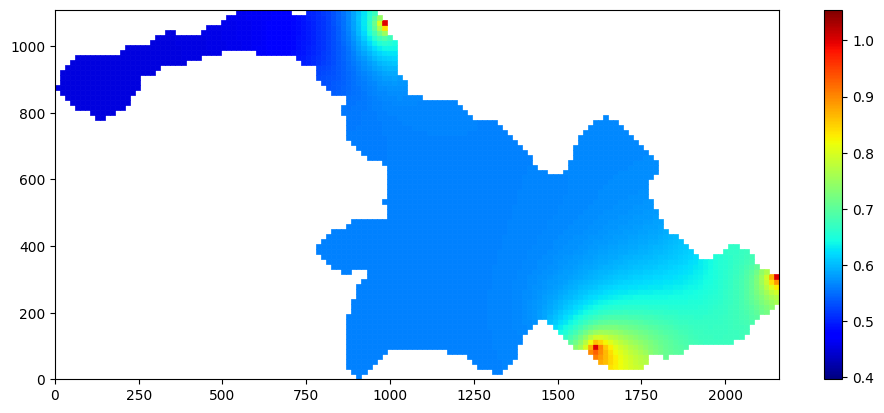

In [56]:
# ploting the unkown's final distribution

print('Distribution after', timeSTR(delT))
delZ = z.max() - z.min()
viewer = Viewer(vars = (z),
                datamin = z.min()-delZ*.1,
                datamax = z.max()+delZ*.1)

outputFileName = r'./output/' + gridType + 'Grid/lakePollutant_zFinal.jpg'
viewer.plot(outputFileName)

# Contour ploter function definition

In [57]:
# read the filtered lake boundary
import pandas as pd

lakeBoundaryVerticesFiltered = './output/lakeBoundaryVerticesFiltered.csv'
dfFilteredLakeBoundary = pd.read_csv(lakeBoundaryVerticesFiltered, usecols = ['x', 'y'])
display(dfFilteredLakeBoundary.head(3))

,x,y
0,908,0
1,939,32
2,970,63


In [58]:
# interpolate z-values at regular grid vertices
from scipy.interpolate import griddata
from shapely.geometry import Polygon
from shapely.geometry import Point

# define the rigular grid
nxr, nyr = 2*nx+1, 2*ny+1
xr = np.linspace(xL, xR, nxr)
yr = np.linspace(yL, yR, nyr)
[X, Y] = np.meshgrid(xr, yr)

# making mask for the vertices of the regular grid that are outside the lack
vertices = list(map(tuple, np.asarray(dfFilteredLakeBoundary)))
lakeShapelyPolygon = Polygon(vertices)
contains = np.vectorize(lambda p: lakeShapelyPolygon.contains(Point(p)), signature='(n)->()')
regularGridPointsColumnVector = np.array((X,Y)).T.reshape(-1, 2)
lakeRegularGridMask = contains(regularGridPointsColumnVector)

def zAtRegularGridVertices(z):
    global mesh, X, Y

    # interpolate z-values at the regular grid vertices
    zr = griddata((mesh.x, mesh.y), z, (X, Y) , method='linear')

    # (interpolated) z-valuees outside of the lack must be NaN (to not interfere in contour plotting)
    Z = zr.T.reshape(-1, 1)
    Z[~lakeRegularGridMask] = np.nan
    Z = Z.reshape(nxr,nyr).T
    return Z

In [59]:
# defining contour lines distribution
import plotly.graph_objects as go

def goFigure(z, title_text, ncontours=6):
    # computing z values at the rigular grid vertices by interpolation
    Z = zAtRegularGridVertices(z=z)

    # plot data
    data = go.Contour(x=xr, y=yr, z=Z,
                      colorscale='Jet', contours=dict(start=0.,
                                                      end=1.,
                                                      size=0.2,
                                                      coloring='fill'))
    fig = go.Figure(dict({"data": data,
                          "layout": {"title": {"text": title_text},
                                     "title_x":0.5,
                                     'xaxis_title':'East-West (m)', 'yaxis_title':'South-North (m)',
                                     "width":800, "height":500}}))
    return fig

# Post-process the solution, (making contour plot and animation)

In [60]:
fig = goFigure(z=z,
               title_text='Day '+daysSTR(t[-1]))

outputFileName = './output/' + gridType + 'Grid/lakePollutantContourPlot_zFinal.jpg'
fig.write_image(outputFileName)

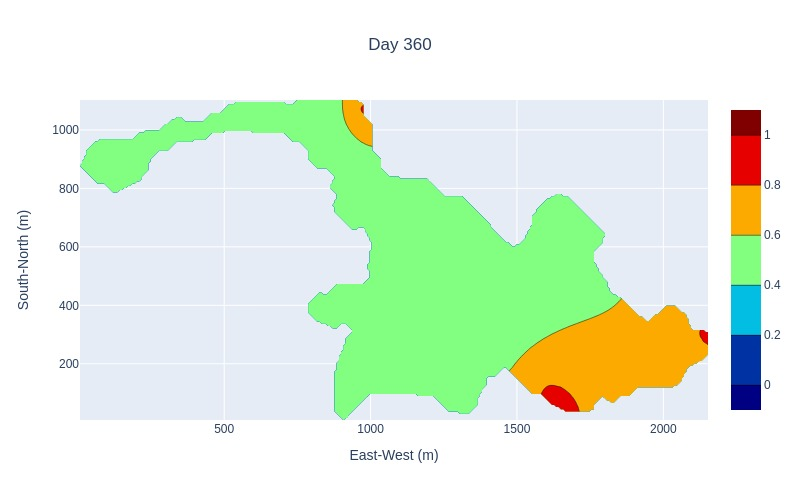

In [61]:
# displaying the image
from IPython.display import Image

Image(open(outputFileName,'rb').read())

In [62]:
# making the gif image
from plotly_gif import GIF

outputFileName = %pwd
outputFileName += r'/output/' + gridType + 'Grid/lakePollutantContourPlot_zFinal.gif'
print('output gif file :', outputFileName)

gif = GIF(mode="png", gif_name=outputFileName, verbose=True)

for ti in save_times:
    fig = goFigure(z=dfSavedResults[zColumnName(ti)],
                   title_text='Day '+daysSTR(ti))
    gif.create_image(fig)
gif.create_gif()

output gif file : /content/drive/MyDrive/perucabaLake/output/regular15Grid/lakePoluantContourPlot_zFinal.gif


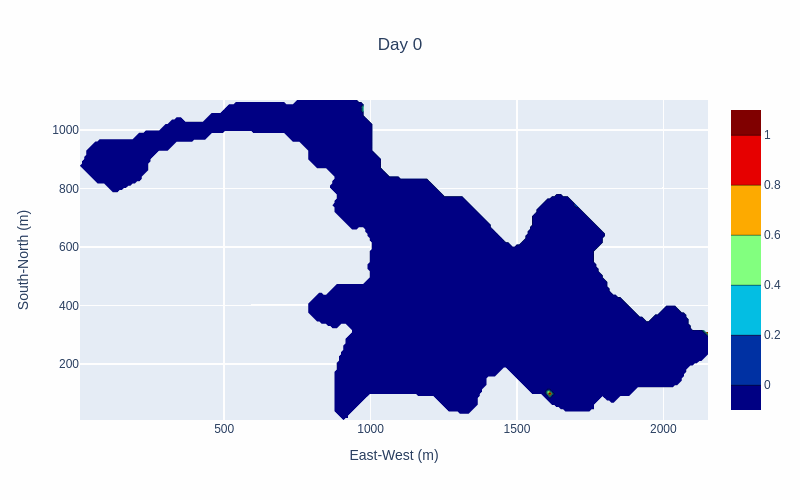

In [63]:
# displaying the animation
from IPython.display import Image

img = Image(open(outputFileName,'rb').read(), embed=True)
display(img)

In [64]:
# make a costumized animation display with a play button
from plotly import express as px

def goFrame(ti):
    # computing z values at the rigular grid vertices by interpolation
    Z = zAtRegularGridVertices(z=dfSavedResults[zColumnName(ti)])

    # plot data
    data = go.Contour(x=xr, y=yr, z=Z,
                      colorscale='Jet', contours=dict(start=0.,
                                                      end=1.,
                                                      size=0.2,
                                                      coloring='fill'))
    return go.Frame(data=data)

# make the initial figure
fig = goFigure(z=dfSavedResults[zColumnName(ti=save_times[0])],
               title_text='Day '+daysSTR(0))

# insert the frames into the figure and set each frame's title_text
fig.update(frames=[goFrame(ti=ti) for ti in save_times]);
for i in range(len(fig.frames)):
    fig.frames[i]['layout'].update(title_text='Day '+daysSTR(save_times[i]))

# make the update menu and insert the play button
fig.update_layout(updatemenus=[dict(type='buttons',
                                    x=-0.1, y=-0.15,
                                    xanchor='left', yanchor='bottom',
                                    buttons = [dict(
                                               args = [None, {"frame": {"duration": 50,
                                                                        "redraw": True},
                                                              "fromcurrent": True,
                                                              "transition": {"duration": 0}}],
                                               label = "Play",
                                               method = "animate")],
                                showactive=True)])
#fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 200
fig.show()

# Read the results from file and plot figures
To read the results from a file, one needs the folowing sections:


*   Space discretization
*   Time discretization
*   Define the contour ploter function

Then, run the notebook cells below.



In [65]:
# input the sim results from a csv file
import pandas as pd

inputFileName = r'./output/' + gridType + 'Grid/lakePolluant_savedResults.csv'
dfSavedResults = pd.read_csv(inputFileName)
display(dfSavedResults.head(3))

,Unnamed: 0,x,y,z_0.0,z_720.0,z_1440.0,z_2160.0,z_2880.0,z_3600.0,z_4320.0,z_5040.0,z_5760.0,z_6480.0,z_7200.0,z_7920.0,z_8640.0
0,0,907.5,7.5,0.0,0.239143,0.276343,0.311725,0.345376,0.377382,0.407823,0.436776,0.464313,0.490504,0.515414,0.539106,0.561640
1,1,892.5,22.5,0.0,0.239145,0.276345,0.311726,0.345377,0.377383,0.407824,0.436777,0.464314,0.490505,0.515415,0.539107,0.561641
2,2,907.5,22.5,0.0,0.239145,0.276345,0.311726,0.345377,0.377383,0.407824,0.436777,0.464314,0.490505,0.515415,0.539107,0.561641


In [66]:
closest_idx = lambda val, arr: np.abs(arr - val).argmin()

# define time's and df column's names upon time value
tiSTR = lambda ti: str(round(ti,3))
zColumnName = lambda ti: f'z_{tiSTR(ti)}'

def zAtInstant(instant):
  save_timeIdx = closest_idx(instant, t)
  save_time = t[save_timeIdx]
  dfColumnName = zColumnName(save_time)
  print('save_timeIdx = ', save_timeIdx, ', ',
        'save_time = ', save_time, ', ',
        'dfColumnName = ', dfColumnName)

  return dfSavedResults[dfColumnName]

In [67]:
monthsNbr = 12
fig = goFigure(z=zAtInstant(24*30*monthsNbr),
               title_text= r'after ' + str(monthsNbr) +' Months')

outputFileName = './output/' + gridType + 'Grid/lakePollutantContourPlotAfter' + str(monthsNbr) +'Months.jpg'
fig.write_image(outputFileName)

save_timeIdx =  8640 ,  save_time =  8640.0 ,  dfColumnName =  z_8640.0
